# ATHENA CAMM Hackathon 01
## Boundary Detection + Atom Finding

**September 2026**

A scientific algorithm should not only work once. It should be **explainable, testable, fast, consistent, and robust**.

### Challenge 1 — Boundary Detection
- Dataset: **SiSb**
- Input: **12 HAADF-STEM images**
- Goal: detect the crystalline–amorphous boundary

### Challenge 2 — Atom Finding
- Dataset: **YBCO**
- Input: atomic-resolution STEM images
- Goal: return atomic-column coordinates

All helper functions are kept in:

```text
utils.py
```

The notebook stays focused on the two functions you are asked to improve.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/kbarakati/athena_camm_hackathon/blob/k4my4r/docs/day_16_11092026/boundary_detection.ipynb)

## 1. Setup

In [1]:
 %pip install -q pyTEMlib ipympl

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 31.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.0/519.0 kB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 859.7/859.7 kB 50.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 80.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 68.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.7/135.7 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.0/128.0 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 83.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 MB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.5/962.5 kB 47.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 66.0 MB/s eta 0:00:00
   ━

In [2]:
# # Download only the files needed for this challenge
# !git clone -q --filter=blob:none --no-checkout -b k4my4r \
#     https://github.com/kbarakati/athena_camm_hackathon.git athena

# %cd athena
# !git sparse-checkout init --cone
# !git sparse-checkout set docs/day_16_11092026
# !git checkout -q

# %cd docs/day_16_11092026


In [3]:
# # Download only the files needed for this challenge
!git clone -q --filter=blob:none --no-checkout -b k4my4r \
    https://github.com/kbarakati/athena_camm_hackathon.git athena

%cd athena
!git sparse-checkout init --cone
!git sparse-checkout set docs/day_16_11092026
!git checkout -q

%cd docs/day_16_11092026

/content/athena
remote: Enumerating objects: 33, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 33 (delta 0), reused 0 (delta 0), pack-reused 31 (from 1)
Receiving objects: 100% (33/33), 112.25 MiB | 14.32 MiB/s, done.
/content/athena/docs/day_16_11092026


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import ndimage

from utils import (
    resolve_data_dir,
    list_emd_files,
    robust_normalize,
    load_haadf,
    show_image_grid,
    plot_ground_truth_grid,
    plot_boundary_result,
    evaluate_against_ground_truth,
    summarize_accuracy,
    evaluate_robustness,
    summarize_robustness,
    evaluate_speed,
    summarize_speed,
    plot_atom_result,
    validate_atom_output,
    atom_repeatability,
    atom_noise_robustness,
    atom_photometric_robustness,
)

copied from /usr/local/lib/python3.13/dist-packages/pyTEMlib/data: xrays_X_section_300kV.json
copied from /usr/local/lib/python3.13/dist-packages/pyTEMlib/data: xrays_X_section_200kV.json
copied from /usr/local/lib/python3.13/dist-packages/pyTEMlib/data: k_factors_Bruker_15keV.json
copied from /usr/local/lib/python3.13/dist-packages/pyTEMlib/data: k_factors_Thermo_60keV.json
copied from /usr/local/lib/python3.13/dist-packages/pyTEMlib/data: k_factors_Thermo_200keV.json
copied from /usr/local/lib/python3.13/dist-packages/pyTEMlib/data: xrays_X_section_60kV.json
copied from /usr/local/lib/python3.13/dist-packages/pyTEMlib/data: xrays_X_section_100kV.json


In [5]:
DATA_DIR = resolve_data_dir()

SISB_DIR = DATA_DIR / "SiSb"
YBCO_DIR = DATA_DIR / "YBCO"
GT_DIR = DATA_DIR / "SiSb_ground_truth"

print("DATA_DIR:", DATA_DIR)
print("SiSb:", SISB_DIR.exists())
print("YBCO:", YBCO_DIR.exists())
print("SiSb ground truth:", GT_DIR.exists())

DATA_DIR: /content/athena/docs/day_16_11092026/data
SiSb: True
YBCO: True
SiSb ground truth: True


# Challenge 1 — Boundary Detection

## Goal

Write:

```python
boundary = detect_boundary(image)
```

The function must return a **2D boolean array with the same shape as the input image**.

`True` means that pixel belongs to the predicted crystalline–amorphous boundary.

## 2. Load the SiSb challenge images

In [6]:
all_sisb_files = list_emd_files(SISB_DIR)

N_SISB = 12
sisb_files = all_sisb_files[:N_SISB]

sisb_images = [
    load_haadf(file)
    for file in sisb_files
]

sisb_titles = [
    file.stem.split("-")[0].strip()
    for file in sisb_files
]

print(f"Using {len(sisb_files)} SiSb images")

Using 12 SiSb images


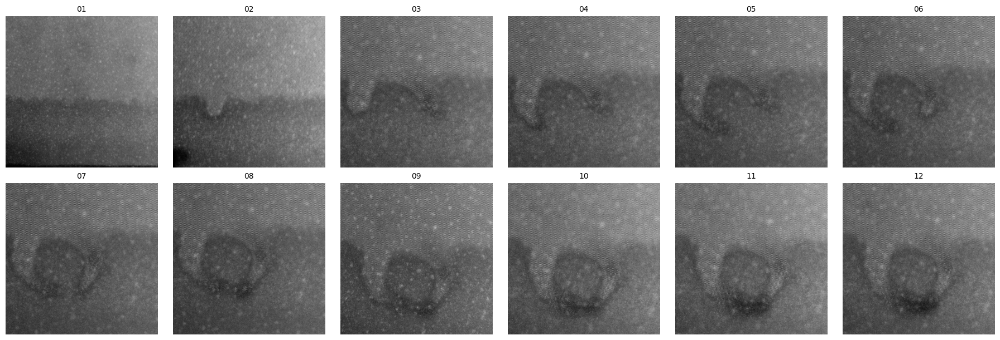

In [7]:
show_image_grid(
    sisb_images,
    titles=sisb_titles,
    rows=2,
)

### Human ground truth

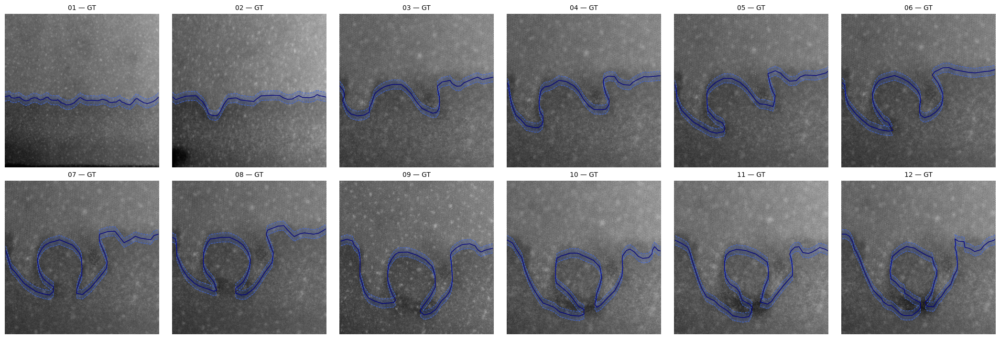

In [8]:
plot_ground_truth_grid(
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    rows=2,
)

## 3. Build your boundary detector

A simple texture-based baseline is provided.

You may completely replace the code between the two markers.  
Do **not** change the function name, input, or required output format.

In [9]:
def detect_boundary(image):

    # ============================================================
    # ===== YOUR CODE START — CHANGE CODE BELOW THIS LINE =====
    # ============================================================

    # Approach: "lattice amplitude" segmentation.
    # The crystalline phase shows lattice fringes (sharp Bragg peaks in the
    # FFT); the amorphous phase does not. We keep only the Bragg peaks,
    # transform back, and measure how strong the lattice signal is at every
    # pixel. That map does not care about brightness, contrast or slow
    # background gradients, and it averages out random noise.

    from scipy import fft as sfft

    # ---------------- tunable parameters ----------------
    BIN = 2               # bin 2x2 pixels first (4x faster, lattice still resolved)
    N_PEAKS = 16          # max number of Bragg peaks used for the lattice filter
    PEAK_PROMINENCE = 1.0 # a peak must stand this far (log power) above its surroundings
    PEAK_WIDTH = 0.35     # Gaussian width of each peak mask, as a fraction of |k| of the lattice
    SMOOTH_PERIODS = 1.5  # smoothing of the lattice amplitude, in lattice periods
    ALPHA = 0.10          # threshold position between amorphous (0) and crystalline (1) level;
                          # 0.10 matches where the human annotators drew the boundary
                          # (at the first sign of lattice, not at the 50% point)

    def otsu(values):
        hist, edges = np.histogram(values, 256)
        centers = (edges[:-1] + edges[1:]) / 2
        w0 = np.cumsum(hist)
        w1 = w0[-1] - w0
        m0 = np.cumsum(hist * centers)
        with np.errstate(invalid="ignore", divide="ignore"):
            between = (m0[-1] * w0 / w0[-1] - m0) ** 2 / (w0 * w1)
        return centers[np.nanargmax(between)]

    def keep_largest(mask):
        labels, n = ndimage.label(mask)
        if n == 0:
            return mask
        sizes = np.bincount(labels.ravel())[1:]
        return labels == (np.argmax(sizes) + 1)

    # 1. Clean input, bin, remove slow background, robust scale
    x = np.nan_to_num(np.asarray(image, dtype=np.float64))
    H, W = x.shape
    h2, w2 = H // BIN, W // BIN
    xb = x[:h2 * BIN, :w2 * BIN].reshape(h2, BIN, w2, BIN).mean(axis=(1, 3))
    xb = xb - ndimage.uniform_filter(xb, size=max(h2, w2) // 16)
    scale = np.percentile(xb, 99) - np.percentile(xb, 1)
    xb = xb / (scale if scale > 0 else 1.0)

    # 2. Find the Bragg peaks automatically (works at any magnification)
    F = sfft.rfft2(xb, workers=-1)
    ky = np.fft.fftfreq(h2)[:, None]
    kx = np.fft.rfftfreq(w2)[None, :]
    kr = np.hypot(ky, kx)
    logP = np.log1p(np.abs(F) ** 2)
    prominence = ndimage.gaussian_filter(logP, 1.0) - ndimage.gaussian_filter(logP, 10.0)
    band = (kr > 1 / 20) & (kr < 1 / 2.2) & (np.abs(ky) > 3 / h2) & (kx > 3 / w2)
    is_peak = (
        (prominence == ndimage.maximum_filter(prominence, size=9))
        & band
        & (prominence > PEAK_PROMINENCE)
    )
    peak_idx = np.argwhere(is_peak)
    order = np.argsort(prominence[is_peak])[::-1][:N_PEAKS]
    peak_idx = peak_idx[order]
    boundary = np.zeros((H, W), dtype=bool)
    if len(peak_idx) == 0:
        # no lattice found at all: nothing to separate
        return boundary
    k_peaks = np.c_[ky[peak_idx[:, 0], 0], kx[0, peak_idx[:, 1]]]
    k_min = np.hypot(k_peaks[:, 0], k_peaks[:, 1]).min()
    period = 1.0 / k_min

    # 3. Bragg filter -> local lattice amplitude (log)
    sigma_k = PEAK_WIDTH * k_min
    mask = np.zeros(kr.shape)
    for py, px in k_peaks:
        mask = np.maximum(mask, np.exp(-((ky - py) ** 2 + (kx - px) ** 2) / (2 * sigma_k ** 2)))
    lattice = sfft.irfft2(F * mask, s=(h2, w2), workers=-1)
    amplitude = np.log(ndimage.gaussian_filter(lattice ** 2, SMOOTH_PERIODS * period) + 1e-12)

    # 4. Threshold: Otsu finds the two levels, ALPHA places the cut between them
    t = otsu(amplitude)
    low = np.median(amplitude[amplitude <= t])
    high = np.median(amplitude[amplitude > t])
    crystal = amplitude > low + ALPHA * (high - low)

    # 5. Clean: one crystalline region, one amorphous region (no islands / holes)
    crystal = keep_largest(crystal)
    crystal = ~keep_largest(~crystal)

    # 6. Interface = crystal pixels touching amorphous pixels (image frame excluded)
    edge = crystal & ~ndimage.binary_erosion(crystal, border_value=1)
    boundary[:h2 * BIN, :w2 * BIN] = np.repeat(np.repeat(edge, BIN, axis=0), BIN, axis=1)

    # ============================================================
    # ===== YOUR CODE END — DO NOT CHANGE CODE BELOW HERE =====
    # ============================================================

    return boundary.astype(bool)

## 4. Test one image visually

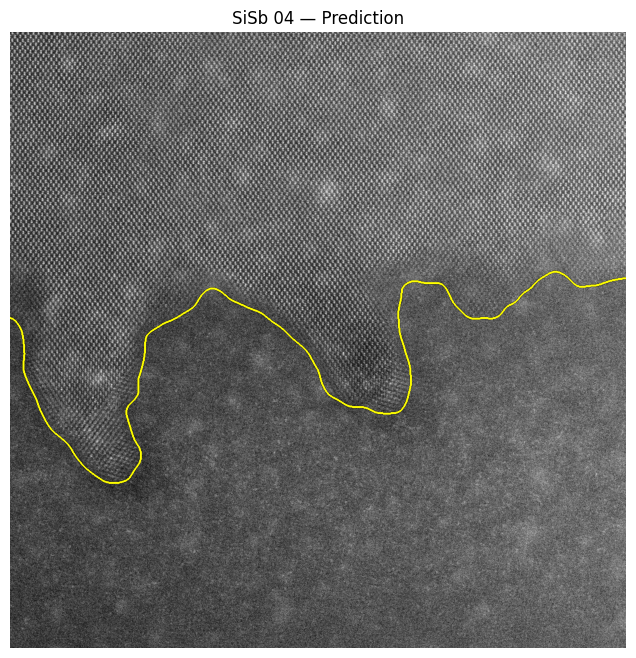

In [10]:
example_index = 3

image = sisb_images[example_index]
boundary = detect_boundary(image)

plot_boundary_result(
    image,
    boundary,
    title=f"SiSb {sisb_titles[example_index]} — Prediction",
)

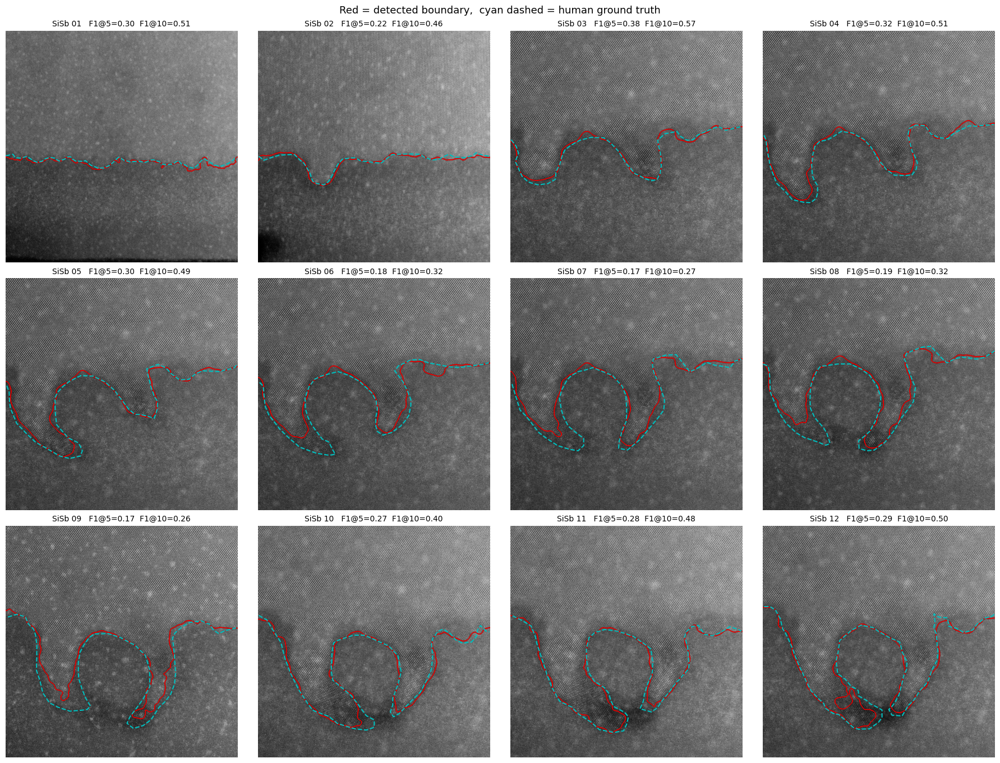

In [21]:
 # ---- Challenge 1: all 12 predictions vs human ground truth ----
from pathlib import Path
from utils import boundary_metrics

rows, cols = 3, 4
fig, axes = plt.subplots(rows, cols, figsize=(4.5 * cols, 4.5 * rows), constrained_layout=True)

for ax, image, file, title in zip(axes.ravel(), sisb_images, sisb_files, sisb_titles):
    pred = detect_boundary(image)
    ax.imshow(image, cmap="gray",
              vmin=np.percentile(image, 1), vmax=np.percentile(image, 99.5))

    # prediction (thickened only for display)
    shown = ndimage.binary_dilation(pred, iterations=4)
    ax.imshow(np.ma.masked_where(~shown, shown), cmap="autumn_r", vmin=0, vmax=1)

    # human ground-truth line
    gt_file = Path(GT_DIR) / f"{Path(file).stem}_ground_truth.npz"
    gt = np.load(gt_file, allow_pickle=True)
    ax.plot(gt["points_xy"][:, 0], gt["points_xy"][:, 1], "c--", lw=1.5)

    # F1 for this image
    f1_5 = boundary_metrics(pred, gt["boundary_mask"], tolerance_px=5)["f1"]
    f1_10 = boundary_metrics(pred, gt["boundary_mask"], tolerance_px=10)["f1"]
    ax.set_title(f"SiSb {title}   F1@5={f1_5:.2f}  F1@10={f1_10:.2f}", fontsize=10)
    ax.axis("off")

for ax in axes.ravel()[len(sisb_images):]:
    ax.axis("off")

fig.suptitle("Red = detected boundary,  cyan dashed = human ground truth", fontsize=13)
plt.show()

## 5. Challenge 1 evaluation

We evaluate only three things:

### 1. Accuracy against human ground truth
Predictions are compared with the hand-drawn boundary using a spatial tolerance. Exact single-pixel agreement is not required.

Primary metric: **F1 @ 5 px tolerance**

### 2. Robustness
The same detector is tested after controlled perturbations:
- Gaussian noise
- Gaussian blur
- brightness change
- contrast change
- inclined intensity background

Every perturbed prediction is compared with the **same human ground truth**.

### 3. Speed
Only `detect_boundary(image)` is timed. File loading, plotting, and scoring are excluded.

### Test 1 — Accuracy against ground truth

In [11]:
accuracy_results = evaluate_against_ground_truth(
    detect_boundary,
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    tolerance_px=10,
)

accuracy_results

,image,precision,recall,f1,mean_pred_to_gt_distance,mean_gt_to_pred_distance,mean_symmetric_boundary_error
0,01,0.485544,0.532935,0.508137,12.546672,11.094915,11.820794
1,02,0.464034,0.452014,0.457945,12.292673,12.666475,12.479574
2,03,0.564045,0.569397,0.566708,12.174185,11.900059,12.037122
3,04,0.530480,0.497912,0.513681,14.450553,15.069434,14.759994
4,05,0.496111,0.474770,0.485206,14.274236,15.608513,14.941374
5,06,0.345185,0.298924,0.320393,24.994778,44.781059,34.887918
6,07,0.286206,0.263623,0.274451,28.089700,38.789445,33.439573
7,08,0.338206,0.304223,0.320316,22.588536,39.177396,30.882966
8,09,0.268009,0.248065,0.257652,34.402189,42.955305,38.678747
9,10,0.408014,0.384212,0.395755,15.137382,18.933676,17.035529


In [12]:
summarize_accuracy(
    accuracy_results
)

,Clean boundary accuracy
mean_precision,0.431113
mean_recall,0.417355
mean_f1,0.423736
mean_boundary_error_px,20.965108


### Test 2 — Robustness

In [13]:
robustness_results = evaluate_robustness(
    detect_boundary,
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    tolerance_px=5,
    max_images=4,
)

robustness_summary = summarize_robustness(
    robustness_results
)

robustness_summary

,condition,mean_f1,std_f1,mean_precision,mean_recall,mean_boundary_error_px,f1_drop_from_clean
0,Clean,0.278130,0.057868,0.282781,0.274255,18.747211,0.000000
1,Gaussian noise 5%,0.285334,0.059488,0.290549,0.280971,18.717687,-0.007204
2,Gaussian blur sigma=1,0.275764,0.041830,0.281358,0.270829,16.396918,0.002366
3,Brightness +10%,0.278130,0.057868,0.282781,0.274255,18.747211,0.000000
4,Contrast -20%,0.278130,0.057868,0.282781,0.274255,18.747211,0.000000
5,Intensity gradient 20%,0.278153,0.057874,0.282781,0.274301,18.745992,-0.000023


Interpretation:

- `mean_f1`: accuracy under that condition
- `mean_boundary_error_px`: average symmetric distance to the human boundary
- `f1_drop_from_clean`: performance lost relative to the clean images

**Smaller F1 drop is better.**

### Test 3 — Speed

In [14]:
speed_results = evaluate_speed(
    detect_boundary,
    sisb_images,
    repeats=5,
)

summarize_speed(
    speed_results
)

,Speed
mean_seconds_per_image,0.727373
median_seconds_per_image,0.654632
slowest_seconds,1.176889
images_per_second,1.374811


# Challenge 2 — Atom Finding in YBCO

## Goal

Write:

```python
positions = find_atoms(image)
```

The function must return a NumPy array of shape `(N, 2)`.

Each row is:

```text
[y, x]
```

in pixel coordinates.

## 6. Load YBCO

Found 3 YBCO images


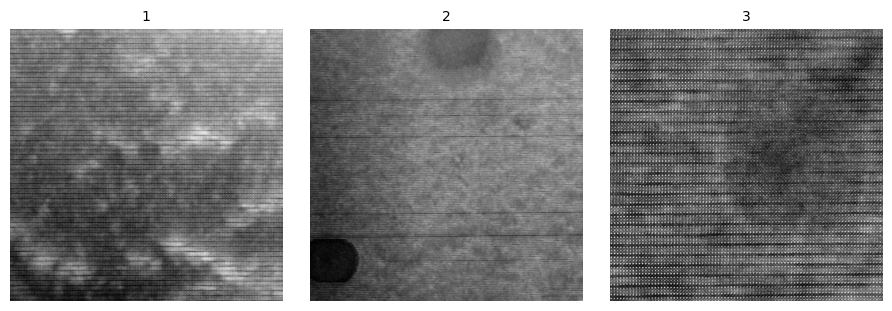

In [15]:
ybco_files = list_emd_files(YBCO_DIR)

ybco_images = [
    load_haadf(file)
    for file in ybco_files
]

ybco_titles = [
    file.stem
    for file in ybco_files
]

print(f"Found {len(ybco_images)} YBCO images")

if ybco_images:
    show_image_grid(
        ybco_images,
        titles=[
            str(i + 1)
            for i in range(len(ybco_images))
        ],
        rows=1 if len(ybco_images) > 1 else 1,
    )

## 7. Build your atom finder

A simple local-maximum baseline is provided.

You may completely replace the code between the two markers.

In [16]:
def find_atoms(image):

    # ============================================================
    # ===== YOUR CODE START — CHANGE CODE BELOW THIS LINE =====
    # ============================================================

    # Approach: scale-adaptive peak finding.
    # 1) measure the column spacing d from the image itself (autocorrelation),
    # 2) smooth with a Gaussian matched to the column size (~0.15 d),
    # 3) local maxima with a minimum separation of ~0.6 d,
    # 4) reject maxima that do not stand out from their surroundings
    #    (prominence measured in noise units, so dim columns are kept),
    # 5) refine each position to sub-pixel accuracy.
    # Every length scales with d, so the same code works at 520 kx and 2.9 Mx.

    from scipy import fft as sfft

    # ---------------- tunable parameters ----------------
    SMOOTH_FRAC = 0.15  # Gaussian sigma as a fraction of the spacing d
    SEP_FRAC = 0.60     # minimum distance between two atoms, fraction of d
    PROM_K = 3.0        # a peak must rise PROM_K x noise above its local minimum
    EDGE_FRAC = 0.30    # ignore peaks closer than this fraction of d to the border

    x = np.nan_to_num(np.asarray(image, dtype=np.float64))
    H, W = x.shape
    positions = np.zeros((0, 2))

    if min(H, W) >= 16 and np.ptp(x) > 0:

        # 1. Robust normalization (on a subsample, for speed)
        lo, hi = np.percentile(x[::4, ::4], [1, 99])
        x = (x - lo) / (hi - lo if hi > lo else 1.0)

        # 2. Column spacing d from the autocorrelation of a central crop
        c = min(1024, H, W)
        y0, x0 = (H - c) // 2, (W - c) // 2
        crop = x[y0:y0 + c, x0:x0 + c]
        crop = crop - crop.mean()
        P = np.abs(sfft.rfft2(crop, workers=-1)) ** 2
        kr = np.hypot(np.fft.fftfreq(c)[:, None], np.fft.rfftfreq(c)[None, :])
        P[kr < 1 / 64] = 0                         # ignore slow intensity variations
        R = min(64, c // 4)
        acf = np.fft.fftshift(sfft.irfft2(P, s=(c, c), workers=-1))
        acf = acf[c // 2 - R:c // 2 + R + 1, c // 2 - R:c // 2 + R + 1]
        yy, xx = np.mgrid[-R:R + 1, -R:R + 1]
        rr = np.hypot(yy, xx)
        acf_peaks = (
            (acf == ndimage.maximum_filter(acf, size=3))
            & (rr >= 2.5)
            & (acf > 0.2 * acf[R, R])
        )
        d = float(rr[acf_peaks].min()) if acf_peaks.any() else 8.0

        # 3. Matched smoothing
        sigma = max(0.7, SMOOTH_FRAC * d)
        smooth = ndimage.gaussian_filter(x, sigma)

        # 4. Local maxima with minimum separation, away from the border
        size = max(3, int(round(SEP_FRAC * d)) | 1)
        peaks = smooth == ndimage.maximum_filter(smooth, size=size)
        m = max(int(EDGE_FRAC * d), 1)
        peaks[:m] = False
        peaks[-m:] = False
        peaks[:, :m] = False
        peaks[:, -m:] = False
        r, cc = np.nonzero(peaks)

        # 5. Prominence in noise units (local minimum computed at half resolution)
        local_min = ndimage.minimum_filter(smooth[::2, ::2], size=max(3, int(round(d / 2)) | 1))
        prom = smooth[r, cc] - local_min[
            np.minimum(r // 2, local_min.shape[0] - 1),
            np.minimum(cc // 2, local_min.shape[1] - 1),
        ]
        resid = (x - smooth)[::4, ::4]
        noise = 1.4826 * np.median(np.abs(resid - np.median(resid))) / (2 * np.sqrt(np.pi) * sigma)
        keep = prom > PROM_K * noise
        r, cc = r[keep], cc[keep]

        # 6. Sub-pixel refinement: 1D parabola through the 3 pixels in y and in x
        f0 = smooth[r, cc]
        dy = (smooth[r + 1, cc] - smooth[r - 1, cc]) / 2
        dyy = smooth[r + 1, cc] - 2 * f0 + smooth[r - 1, cc]
        dx = (smooth[r, cc + 1] - smooth[r, cc - 1]) / 2
        dxx = smooth[r, cc + 1] - 2 * f0 + smooth[r, cc - 1]
        off_y = np.where(dyy < 0, -dy / np.where(dyy < 0, dyy, -1.0), 0.0)
        off_x = np.where(dxx < 0, -dx / np.where(dxx < 0, dxx, -1.0), 0.0)
        positions = np.c_[r + np.clip(off_y, -0.5, 0.5), cc + np.clip(off_x, -0.5, 0.5)]

    # ============================================================
    # ===== YOUR CODE END — DO NOT CHANGE CODE BELOW HERE =====
    # ============================================================

    return np.asarray(
        positions
    ).reshape(-1, 2).astype(float)

## 8. Test one YBCO image visually

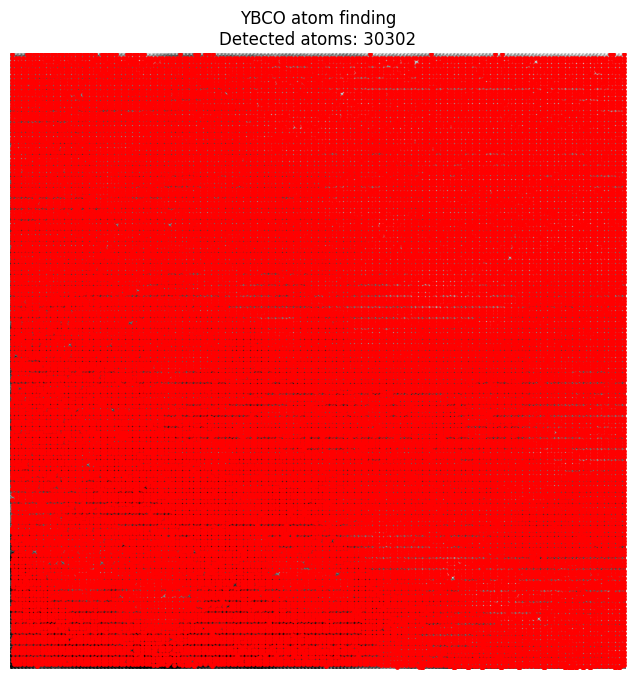

In [17]:
if ybco_images:

    atom_example_index = 0

    atom_positions = find_atoms(
        ybco_images[atom_example_index]
    )

    validate_atom_output(
        ybco_images[atom_example_index],
        atom_positions,
    )

    plot_atom_result(
        ybco_images[atom_example_index],
        atom_positions,
        title="YBCO atom finding",
    )

## 9. Challenge 2 engineering tests

Until atom ground truth is added, these measure **consistency and robustness**, not true atom-detection accuracy.

In [18]:
if ybco_images:
    atom_noise_results = atom_noise_robustness(
        find_atoms,
        ybco_images,
        noise_levels=(0.01, 0.03, 0.05, 0.10),
        tolerance=2.0,
    )

atom_noise_results

,noise_level_fraction,mean_F1_vs_clean,min_F1_vs_clean,mean_count_ratio
0,0.01,0.995393,0.991363,0.999933
1,0.03,0.986956,0.976180,1.002050
2,0.05,0.979580,0.962461,1.003790
3,0.10,0.961009,0.929425,1.007669


In [19]:
if ybco_images:
    atom_photometric_results = atom_photometric_robustness(
        find_atoms,
        ybco_images,
        tolerance=2.0,
    )

atom_photometric_results

,gain,offset_fraction,mean_F1_vs_clean
0,0.8,0.0,1.0
1,1.2,0.0,1.0
2,1.0,0.1,1.0


In [20]:
if ybco_images:

    atom_speed_results = evaluate_speed(
        find_atoms,
        ybco_images,
        repeats=5,
    )

summarize_speed(
        atom_speed_results
    )

,Speed
mean_seconds_per_image,0.623026
median_seconds_per_image,0.580128
slowest_seconds,0.841838
images_per_second,1.605070


# 10. Reflection

At the end of the session, be ready to explain:

1. What approach did you use?
2. Which parameters matter most?
3. Where does it fail?
4. What would you improve next?
5. If AI helped write code, what did it generate?
6. What did you personally change?

> A good scientific algorithm is not just one that gives a nice picture.  
> You should be able to explain **how accurate, robust, and fast it is**.

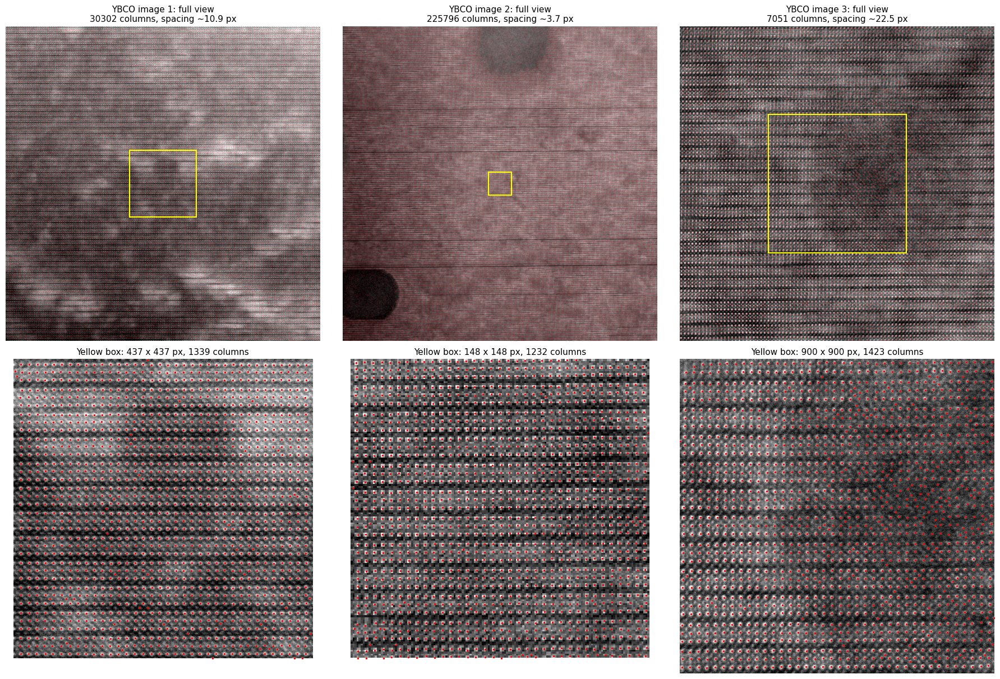

In [23]:
# ---- Challenge 2: zoomed-out overview of all 3 YBCO images ----
# Row 1: the whole image (2048 x 2048), atoms as tiny dots.
# Row 2: a medium zoom (about 40 atom spacings wide) from the centre, where
#        you can still see the lattice pattern and each detected column.
from scipy.spatial import cKDTree

MEDIUM_ATOMS = 40   # width of the medium zoom, in atom spacings

n = len(ybco_images)
fig, axes = plt.subplots(2, n, figsize=(6 * n, 12), constrained_layout=True, squeeze=False)

for i, image in enumerate(ybco_images):
    image = np.asarray(image, dtype=float)
    H, W = image.shape
    pos = find_atoms(image)

    # spacing from the detections (median nearest-neighbour distance)
    if len(pos) > 1:
        dist, _ = cKDTree(pos).query(pos, k=2)
        spacing = float(np.median(dist[:, 1]))
    else:
        spacing = 10.0

    # Row 1: full image, dot size scaled down for dense images
    ax = axes[0, i]
    ax.imshow(image, cmap="gray",
              vmin=np.percentile(image, 1), vmax=np.percentile(image, 99.5))
    dot = float(np.clip(20000 / max(len(pos), 1), 0.05, 2.0))
    ax.scatter(pos[:, 1], pos[:, 0], s=dot, c="red", alpha=0.6, linewidths=0)

    size = int(np.clip(MEDIUM_ATOMS * spacing, 100, min(H, W)))
    y0, x0 = (H - size) // 2, (W - size) // 2
    ax.add_patch(plt.Rectangle((x0, y0), size, size, fill=False, ec="yellow", lw=1.5))
    ax.set_title(f"YBCO image {i + 1}: full view\n{len(pos)} columns, spacing ~{spacing:.1f} px",
                 fontsize=11)
    ax.axis("off")

    # Row 2: medium zoom of the yellow box
    crop = image[y0:y0 + size, x0:x0 + size]
    inside = (
        (pos[:, 0] >= y0) & (pos[:, 0] < y0 + size)
        & (pos[:, 1] >= x0) & (pos[:, 1] < x0 + size)
    )
    p = pos[inside] - [y0, x0]
    ax = axes[1, i]
    ax.imshow(crop, cmap="gray",
              vmin=np.percentile(crop, 1), vmax=np.percentile(crop, 99.5))
    ax.scatter(p[:, 1], p[:, 0], s=6, c="red", linewidths=0)
    ax.set_title(f"Yellow box: {size} x {size} px, {inside.sum()} columns", fontsize=11)
    ax.axis("off")

plt.show()

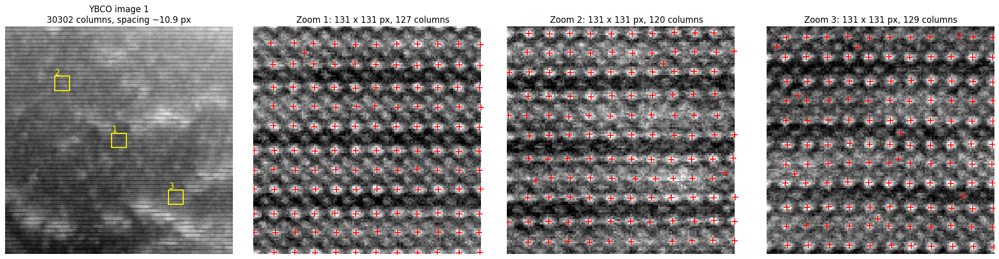

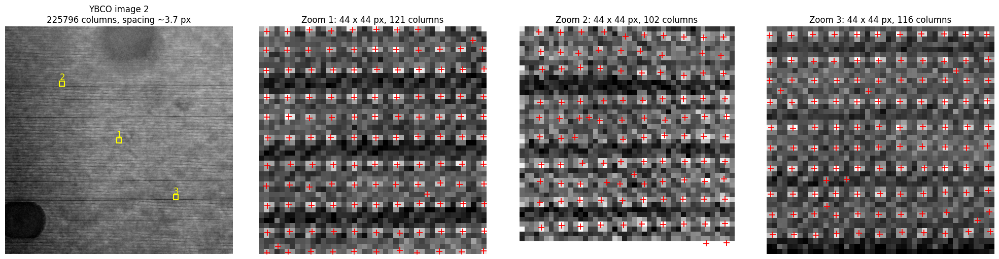

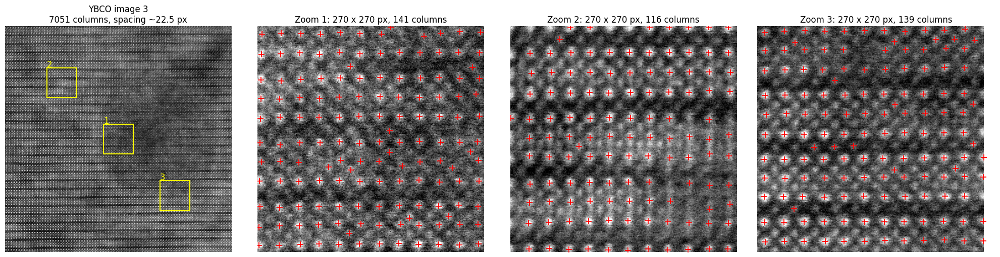

In [22]:
# ---- Challenge 2: full view + zoomed crops so the atoms are visible ----
ZOOM_ATOMS = 12   # each crop is about this many atom spacings wide

def show_atoms_zoom(image, positions, title="", n_crops=3):
    image = np.asarray(image, dtype=float)
    H, W = image.shape

    # estimate spacing from the detections (median nearest-neighbour distance)
    from scipy.spatial import cKDTree
    if len(positions) > 1:
        d, _ = cKDTree(positions).query(positions, k=2)
        spacing = float(np.median(d[:, 1]))
    else:
        spacing = 10.0
    size = int(np.clip(ZOOM_ATOMS * spacing, 40, min(H, W)))

    # crop centres: image centre plus two other places
    centres = [(H // 2, W // 2), (H // 4, W // 4), (3 * H // 4, 3 * W // 4)][:n_crops]

    fig, axes = plt.subplots(1, n_crops + 1, figsize=(5 * (n_crops + 1), 5), constrained_layout=True)

    # full image with the zoom boxes
    ax = axes[0]
    ax.imshow(image, cmap="gray",
              vmin=np.percentile(image, 1), vmax=np.percentile(image, 99.5))
    for k, (cy, cx) in enumerate(centres):
        y0, x0 = cy - size // 2, cx - size // 2
        ax.add_patch(plt.Rectangle((x0, y0), size, size, fill=False, ec="yellow", lw=1.5))
        ax.text(x0, y0 - 10, str(k + 1), color="yellow", fontsize=12)
    ax.set_title(f"{title}\n{len(positions)} columns, spacing ~{spacing:.1f} px")
    ax.axis("off")

    # zoomed crops
    for k, (cy, cx) in enumerate(centres):
        y0 = int(np.clip(cy - size // 2, 0, H - size))
        x0 = int(np.clip(cx - size // 2, 0, W - size))
        crop = image[y0:y0 + size, x0:x0 + size]
        inside = (
            (positions[:, 0] >= y0) & (positions[:, 0] < y0 + size)
            & (positions[:, 1] >= x0) & (positions[:, 1] < x0 + size)
        )
        p = positions[inside] - [y0, x0]
        ax = axes[k + 1]
        ax.imshow(crop, cmap="gray",
                  vmin=np.percentile(crop, 1), vmax=np.percentile(crop, 99.5))
        ax.plot(p[:, 1], p[:, 0], "r+", ms=8, mew=1.3)
        ax.set_title(f"Zoom {k + 1}: {size} x {size} px, {inside.sum()} columns")
        ax.axis("off")

    plt.show()


for i, img in enumerate(ybco_images):
    show_atoms_zoom(img, find_atoms(img), title=f"YBCO image {i + 1}")